#### 套件管理

In [1]:
import torch
torch.__version__

'1.9.0+cu111'

In [ ]:
!pip install --upgrade gdown # 更新下載google drive 套件
!pip install -U PyYAML # 讀取.yaml套件

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
  Created wheel for gdown: filename=gdown-4.4.0-py3-none-any.whl size=14774 sha256=9aaf0489a411da5ce8f9fe228f494e4efa23d89c7281b951bf50ead8ac4dbdf8
  Stored in directory: /root/.cache/pip/wheels/fb/c3/0e/c4d8ff8bfcb0461afff199471449f642179b74968c15b7a69c
Successfully built gdown
  Attempting uninstall: gdown
    Found existing installation: gdown 4.2.2
    Uninstalling gdown-4.2.2:
      Successfully uninstalled gdown-4.2.2
     |████████████████████████████████| 596 kB 27.5 MB/s 
  Attempting uninstall: PyYAML
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13


In [2]:
# !git clone https://github.com/WongKinYiu/ScaledYOLOv4.git
!git clone https://github.com/taipingeric/ScaledYOLOv4.git

Cloning into 'ScaledYOLOv4'...
remote: Enumerating objects: 252, done.
remote: Counting objects: 100% (2/2), done.
remote: Compressing objects: 100% (2/2), done.
remote: Total 252 (delta 0), reused 0 (delta 0), pack-reused 250
Receiving objects: 100% (252/252), 482.64 KiB | 3.22 MiB/s, done.
Resolving deltas: 100% (109/109), done.


In [1]:
# 將pytorch 降版
!pip install torch==1.7.0+cu110 torchvision==0.8.1+cu110 torchtext==0.8 torchaudio===0.7.0 -f https://download.pytorch.org/whl/torch_stable.html

Looking in links: https://download.pytorch.org/whl/torch_stable.html
  Using cached https://download.pytorch.org/whl/cu110/torch-1.7.0%2Bcu110-cp37-cp37m-linux_x86_64.whl (1137.1 MB)
  Using cached https://download.pytorch.org/whl/cu110/torchvision-0.8.1%2Bcu110-cp37-cp37m-linux_x86_64.whl (12.9 MB)
  Using cached torchtext-0.8.0-cp37-cp37m-manylinux1_x86_64.whl (6.9 MB)
  Using cached torchaudio-0.7.0-cp37-cp37m-manylinux1_x86_64.whl (7.6 MB)
  Attempting uninstall: torch
    Found existing installation: torch 1.9.0+cu111
    Uninstalling torch-1.9.0+cu111:
      Successfully uninstalled torch-1.9.0+cu111
  Attempting uninstall: torchvision
    Found existing installation: torchvision 0.10.0+cu111
    Uninstalling torchvision-0.10.0+cu111:
      Successfully uninstalled torchvision-0.10.0+cu111
  Attempting uninstall: torchaudio
    Found existing installation: torchaudio 0.9.0
    Uninstalling torchaudio-0.9.0:
      Successfully uninstalled torchaudio-0.9.0


In [ ]:
# 安裝mish cuda：加速Mish activation計算
!git clone https://github.com/thomasbrandon/mish-cuda
%cd mish-cuda
!python setup.py build install

Cloning into 'mish-cuda'...
remote: Enumerating objects: 107, done.
remote: Total 107 (delta 0), reused 0 (delta 0), pack-reused 107
Receiving objects: 100% (107/107), 52.89 KiB | 13.22 MiB/s, done.
Resolving deltas: 100% (49/49), done.
/content/mish-cuda
running build
running build_py
creating build
creating build/lib.linux-x86_64-3.7
creating build/lib.linux-x86_64-3.7/mish_cuda
copying src/mish_cuda/__init__.py -> build/lib.linux-x86_64-3.7/mish_cuda
running egg_info
creating src/mish_cuda.egg-info
writing src/mish_cuda.egg-info/PKG-INFO
writing dependency_links to src/mish_cuda.egg-info/dependency_links.txt
writing requirements to src/mish_cuda.egg-info/requires.txt
writing top-level names to src/mish_cuda.egg-info/top_level.txt
writing manifest file 'src/mish_cuda.egg-info/SOURCES.txt'
/usr/local/lib/python3.7/dist-packages/torch/utils/cpp_extension.py:339: UserWarning: Attempted to use ninja as the BuildExtension backend but we could not find ninja.. Falling back to using the slo

In [3]:
# 再次確認 Pytorch 版本 1.7.0+cu110；若不是，請在 "執行階段" -> "重新啟動執行階段"
import torch
torch.__version__

'1.9.0+cu111'

#### 資料處理

修改原始coco.yaml檔案，指定為下載的coco128 train, val的圖片資料夾

另存成新的coco128.yaml檔案

切換至 ScaledYOLOv4 資料夾訓練


*   --batch-size: 以Tesla K80 GPU (11GB), 能使用的batch size大小，可以按照抽到的GPU memory大小，決定使用的batch size
*   --img: 圖片大小，以32的倍數為基準，官方使用的anchor box size是以下面的輸入為基準
    * YOLOv4-CSP: 640
    * YOLOv4-P5: 896
    * YOLOv4-P6: 1280
    * YOLOv4-P7: 1536
*  --data: 資料集的yaml檔案
*  --cfg: 模型架構檔
*  --weights: pre-trained weights path
*  --logdir: 預設為ScaledYOLOv4下的 **runs** 資料夾，會存best & last 參數檔，若擔心GPU訓練斷掉，可以換成自己的雲端硬碟



In [ ]:
# Batch size (Tesla K80)

%cd ~/../content/ScaledYOLOv4
!python train.py --batch-size 8 --img 640 640 --data ../coco128.yaml --cfg yolov4-csp.yaml --weights '' --sync-bn --device 0 --name yolov4-csp
# !python train.py --batch-size 4 --img 896 896 --data ../coco128.yaml --cfg yolov4-p5.yaml --weights '' --sync-bn --device 0 --name yolov4-p5
# !python train.py --batch-size 4 --img 1280 1280 --data ../coco128.yaml --cfg yolov4-p6.yaml --weights '' --sync-bn --device 0 --name yolov4-p6
# !python train.py --batch-size 2 --img 1536 1536 --data ../coco128.yaml --cfg yolov4-p7.yaml --weights '' --sync-bn --device 0 --name yolov4-p7

/content/ScaledYOLOv4
Using CUDA device0 _CudaDeviceProperties(name='Tesla T4', total_memory=15109MB)

Namespace(adam=False, batch_size=8, bucket='', cache_images=False, cfg='./models/yolov4-csp.yaml', data='../coco128.yaml', device='0', epochs=300, evolve=False, global_rank=-1, hyp='data/hyp.scratch.yaml', img_size=[640, 640], local_rank=-1, logdir='runs/', multi_scale=False, name='yolov4-csp', noautoanchor=False, nosave=False, notest=False, rect=False, resume=False, single_cls=False, sync_bn=True, total_batch_size=8, weights='', world_size=1)
Start Tensorboard with "tensorboard --logdir runs/", view at http://localhost:6006/
Hyperparameters {'lr0': 0.01, 'momentum': 0.937, 'weight_decay': 0.0005, 'giou': 0.05, 'cls': 0.5, 'cls_pw': 1.0, 'obj': 1.0, 'obj_pw': 1.0, 'iou_t': 0.2, 'anchor_t': 4.0, 'fl_gamma': 0.0, 'hsv_h': 0.015, 'hsv_s': 0.7, 'hsv_v': 0.4, 'degrees': 0.0, 'translate': 0.5, 'scale': 0.5, 'shear': 0.0, 'perspective': 0.0, 'flipud': 0.0, 'fliplr': 0.5, 'mixup': 0.0}

     

In [ ]:
# 若是使用另一個分支(yolov4-csp)的程式碼 則使用下面指令訓練
# .cfg 為 DarkNet的架構檔案
# %cd ~/../content/ScaledYOLOv4-yolov4-csp
# !python train.py --device 0 --img 416 --data ../coco128.yaml --cfg models/yolov4-csp.cfg --weights '' --name yolov4-csp

/content/ScaledYOLOv4
Traceback (most recent call last):
  File "train.py", line 412, in <module>
    opt.data, opt.cfg, opt.hyp = check_file(opt.data), check_file(opt.cfg), check_file(opt.hyp)  # check files
  File "/content/ScaledYOLOv4/utils/general.py", line 127, in check_file
    assert len(files), 'File Not Found: %s' % file  # assert file was found
AssertionError: File Not Found: models/yolov4-csp.cfg


#### Inference

In [ ]:
# 官方 https://github.com/WongKinYiu/ScaledYOLOv4/tree/yolov4-large 上有p5, p6, p7的pytorch COCO 參數檔
# 下載官方訓練的 yolov4-p5.pt
%cd ~/../content
!gdown --fuzzy https://drive.google.com/file/d/1aXZZE999sHMP1gev60XhNChtHPRMH3Fz/view?usp=sharing

/content
Downloading...
From: https://drive.google.com/uc?id=1aXZZE999sHMP1gev60XhNChtHPRMH3Fz
To: /content/yolov4-p5.pt
100% 142M/142M [00:04<00:00, 29.9MB/s]


使用detect.py 進行預測



*   --source: 目標圖片路徑 or 圖片資料夾
*   --weights: 訓練好的weights
*   --img-size: 數入的圖片大小



In [ ]:
import cv2
import matplotlib.pyplot as plt

# 使用detect.py 進行預測

%cd ~/../content/ScaledYOLOv4
!python detect.py --source ../coco128/images/val2017 --weights ../yolov4-p5.pt --img-size 896

/content/ScaledYOLOv4
Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.4, device='', img_size=896, iou_thres=0.5, output='inference/output', save_txt=False, source='../coco128/images/val2017', update=False, view_img=False, weights=['../yolov4-p5.pt'])
Using CUDA device0 _CudaDeviceProperties(name='Tesla T4', total_memory=15109MB)

Fusing layers... Model Summary: 331 layers, 7.07943e+07 parameters, 6.81919e+07 gradients
image 1/20 /content/coco128/images/val2017/000000000575.jpg: 768x896 1 cats, Done. (0.075s)
image 2/20 /content/coco128/images/val2017/000000000581.jpg: 896x896 1 dogs, Done. (0.059s)
image 3/20 /content/coco128/images/val2017/000000000584.jpg: 640x896 1 spoons, 1 bowls, 4 carrots, Done. (0.053s)
image 4/20 /content/coco128/images/val2017/000000000589.jpg: 768x896 1 persons, Done. (0.041s)
image 5/20 /content/coco128/images/val2017/000000000590.jpg: 896x768 1 sinks, Done. (0.045s)
image 6/20 /content/coco128/images/val2017/000000000595.jpg: 768x896

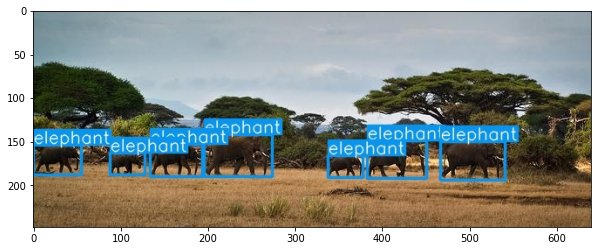

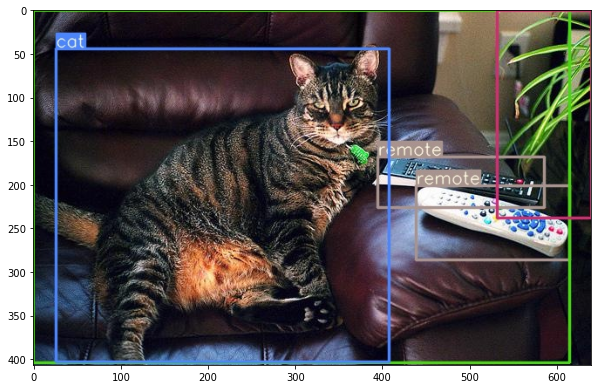

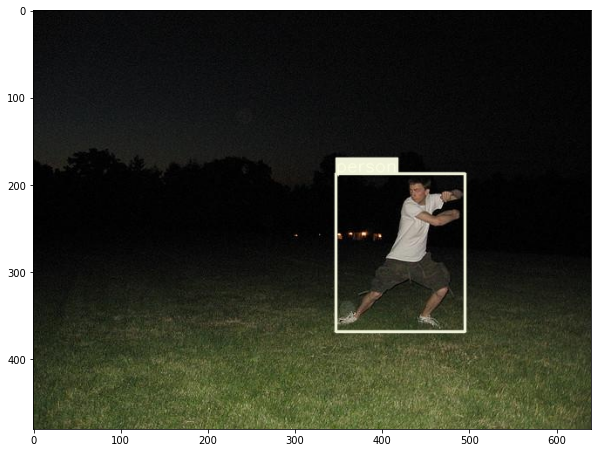

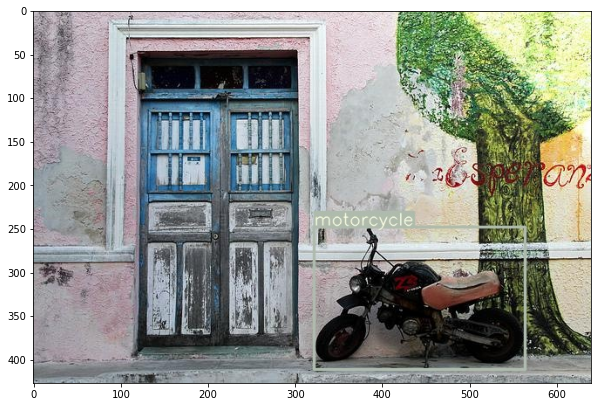

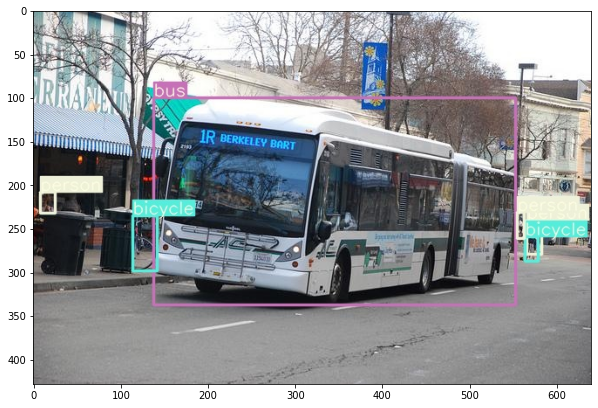

...

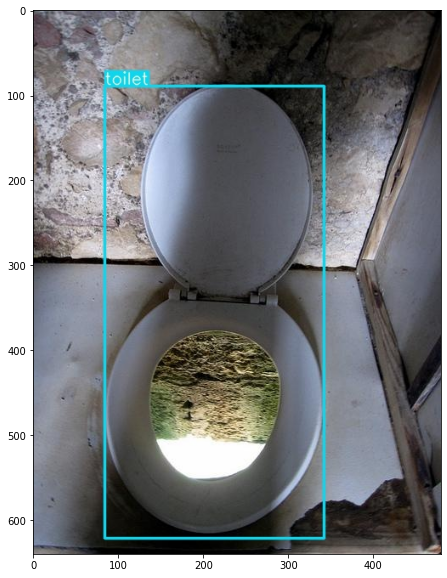

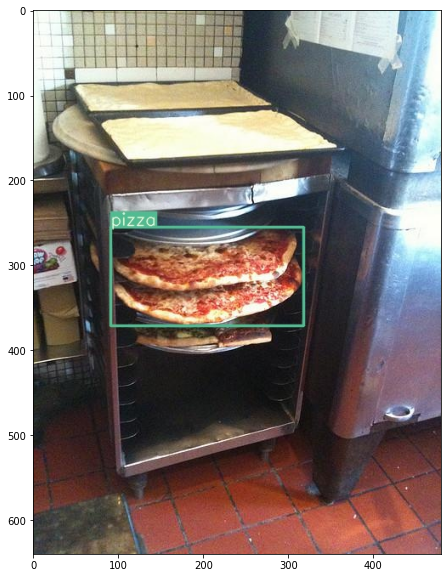

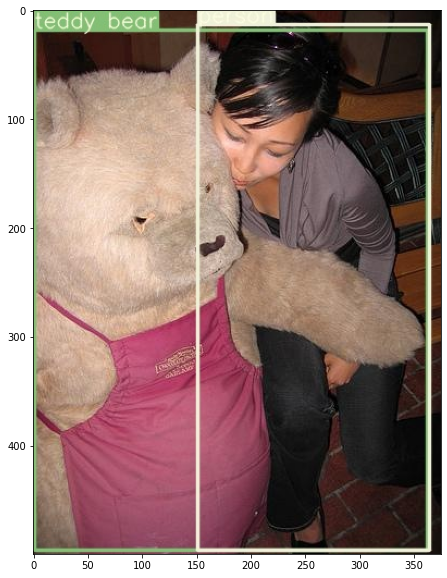

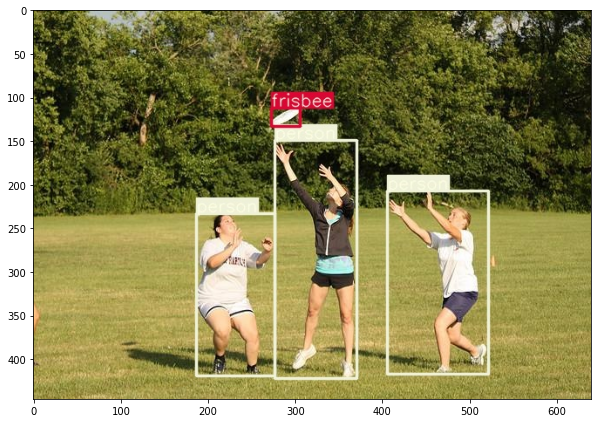

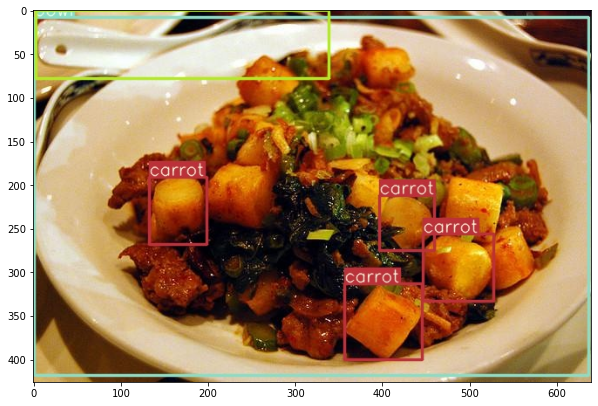

In [ ]:
# 將預測完的圖片全部顯示
import glob

for path in glob.glob('/content/ScaledYOLOv4/inference/output/*.jpg')[:]:
    img = cv2.imread(path)[:, :, ::-1]
    plt.figure(figsize=(10, 10))
    plt.imshow(img)
    plt.show()

#### Excercise: BCCD

嘗試使用XML標注的資料集進行訓練

In [ ]:
# BCCD
# https://drive.google.com/file/d/1Fw6McjEFdlldCNHEeVO6NU2AVApW_Ll9/view?usp=sharing
%cd ~/../content

!gdown --fuzzy https://drive.google.com/file/d/1Fw6McjEFdlldCNHEeVO6NU2AVApW_Ll9/view?usp=sharing
!unzip -q BCCD-xml.zip

/content
Downloading...
From: https://drive.google.com/uc?id=1Fw6McjEFdlldCNHEeVO6NU2AVApW_Ll9
To: /content/BCCD-xml.zip
100% 9.46M/9.46M [00:00<00:00, 30.4MB/s]


convert xml to yolo format

將 xml檔案從VOC格式轉換成yolo格式


In [ ]:
import glob
import os
import pickle
import xml.etree.ElementTree as ET
from os import listdir, getcwd
from os.path import join

def getImagesInDir(dir_path):
    image_list = []
    for filename in glob.glob(dir_path + '/*.jpg'):
        image_list.append(filename)

    return image_list

def convert(size, box):
    dw = 1./(size[0])
    dh = 1./(size[1])
    x = (box[0] + box[1])/2.0 - 1
    y = (box[2] + box[3])/2.0 - 1
    w = box[1] - box[0]
    h = box[3] - box[2]
    x = x*dw
    w = w*dw
    y = y*dh
    h = h*dh
    return (x,y,w,h)

def convert_annotation(dir_path, output_path, image_path):
    basename = os.path.basename(image_path)
    basename_no_ext = os.path.splitext(basename)[0]

    in_file = open(dir_path + '/' + basename_no_ext + '.xml')
    out_file = open(output_path + '/' + basename_no_ext + '.txt', 'w')
    tree = ET.parse(in_file)
    root = tree.getroot()
    size = root.find('size')
    w = int(size.find('width').text)
    h = int(size.find('height').text)

    for obj in root.iter('object'):
        difficult = obj.find('difficult').text
        cls = obj.find('name').text
        if cls not in classes or int(difficult)==1:
            continue
        cls_id = classes.index(cls)
        xmlbox = obj.find('bndbox')
        b = (float(xmlbox.find('xmin').text), float(xmlbox.find('xmax').text), float(xmlbox.find('ymin').text), float(xmlbox.find('ymax').text))
        bb = convert((w,h), b)
        out_file.write(str(cls_id) + " " + " ".join([str(a) for a in bb]) + '\n')


dirs = ['train', 'val'] # 轉換的資料夾
classes = ['RBC', 'WBC', 'Platelets'] # XML檔案中的要使用的類別名稱
imgs_dir = './dataset/images' # 圖片資料夾
labels_dir = './dataset/labels' # 標註的資料夾

for dir_path in dirs:
    full_dir_path = os.path.join(imgs_dir, dir_path)
    xml_dir_path = os.path.join(labels_dir, 'xml', dir_path)
    output_path = os.path.join(labels_dir, dir_path)

    if not os.path.exists(output_path):
        os.makedirs(output_path)

    image_paths = getImagesInDir(full_dir_path)
    list_file = open(labels_dir + '.txt', 'w')

    for image_path in image_paths:
        list_file.write(image_path + '\n')
        convert_annotation(xml_dir_path, output_path, image_path)
    list_file.close()

    print("Finished processing: " + dir_path)

Finished processing: train
Finished processing: val


#### Create **data.yaml**

生成資料集的yaml檔案

*   names: 類別名稱
*   nc: 類別總數
*   train: 訓練圖片資料夾
*   val: 驗證圖片資料夾





In [ ]:
import yaml
from pprint import pprint

data = {
    'names': classes,
    'nc': len(classes),
    'train': '/content/dataset/images/train',
    'val': '/content/dataset/images/val'
 }
with open('./bccd.yaml', 'w') as file:
    _ = yaml.dump(data, file)

update model.yaml

將類別個數更新，因為類別數不同會影響到detection head 輸出的網路架構

In [ ]:
with open('/content/ScaledYOLOv4/models/yolov4-csp.yaml') as file:
    doc = yaml.full_load(file)
    doc['nc'] = len(classes)
    pprint(doc)
    
with open('./yolov4-csp.yaml', 'w') as file:
    _ = yaml.dump(doc, file)

{'anchors': [[12, 16, 19, 36, 40, 28],
             [36, 75, 76, 55, 72, 146],
             [142, 110, 192, 243, 459, 401]],
 'backbone': [[-1, 1, 'Conv', [32, 3, 1]],
              [-1, 1, 'Conv', [64, 3, 2]],
              [-1, 1, 'Bottleneck', [64]],
              [-1, 1, 'Conv', [128, 3, 2]],
              [-1, 2, 'BottleneckCSP', [128]],
              [-1, 1, 'Conv', [256, 3, 2]],
              [-1, 8, 'BottleneckCSP', [256]],
              [-1, 1, 'Conv', [512, 3, 2]],
              [-1, 8, 'BottleneckCSP', [512]],
              [-1, 1, 'Conv', [1024, 3, 2]],
              [-1, 4, 'BottleneckCSP', [1024]]],
 'depth_multiple': 1.0,
 'head': [[-1, 1, 'SPPCSP', [512]],
          [-1, 1, 'Conv', [256, 1, 1]],
          [-1, 1, 'nn.Upsample', ['None', 2, 'nearest']],
          [8, 1, 'Conv', [256, 1, 1]],
          [[-1, -2], 1, 'Concat', [1]],
          [-1, 2, 'BottleneckCSP2', [256]],
          [-1, 1, 'Conv', [128, 1, 1]],
          [-1, 1, 'nn.Upsample', ['None', 2, 'nearest']],


Training from scratch (no pre-trained weights)

In [ ]:
# 換掉資料集yaml檔案
%cd ~/../content/ScaledYOLOv4
!python train.py --batch-size 4 --img 640 640 --data ../bccd.yaml --cfg yolov4-csp.yaml --weights '' --sync-bn --device 0 --name yolov4-csp
# !python train.py --batch-size 4 --img 896 896 --data ../bccd.yaml --cfg yolov4-p5.yaml --weights '' --sync-bn --device 0 --name yolov4-p5
# !python train.py --batch-size 4 --img 1280 1280 --data ../bccd.yaml --cfg yolov4-p6.yaml --weights '' --sync-bn --device 0 --name yolov4-p6
# !python train.py --batch-size 2 --img 1536 1536 --data ../bccd.yaml --cfg yolov4-p7.yaml --weights '' --sync-bn --device 0 --name yolov4-p7

/content/ScaledYOLOv4
Using CUDA device0 _CudaDeviceProperties(name='Tesla K80', total_memory=11441MB)

Namespace(adam=False, batch_size=4, bucket='', cache_images=False, cfg='./models/yolov4-csp.yaml', data='../bccd.yaml', device='0', epochs=300, evolve=False, global_rank=-1, hyp='data/hyp.scratch.yaml', img_size=[640, 640], local_rank=-1, logdir='runs/', multi_scale=False, name='yolov4-csp', noautoanchor=False, nosave=False, notest=False, rect=False, resume=False, single_cls=False, sync_bn=True, total_batch_size=4, weights='', world_size=1)
Start Tensorboard with "tensorboard --logdir runs/", view at http://localhost:6006/
Hyperparameters {'lr0': 0.01, 'momentum': 0.937, 'weight_decay': 0.0005, 'giou': 0.05, 'cls': 0.5, 'cls_pw': 1.0, 'obj': 1.0, 'obj_pw': 1.0, 'iou_t': 0.2, 'anchor_t': 4.0, 'fl_gamma': 0.0, 'hsv_h': 0.015, 'hsv_s': 0.7, 'hsv_v': 0.4, 'degrees': 0.0, 'translate': 0.5, 'scale': 0.5, 'shear': 0.0, 'perspective': 0.0, 'flipud': 0.0, 'fliplr': 0.5, 'mixup': 0.0}
Overridi

Transfer learning (with COCO pre-trained weights)

In [ ]:
# 下載 P5 weights
%cd ~/../content
!gdown --fuzzy https://drive.google.com/file/d/15CL05ZufFk2krbRS993fqlG40Wb0HTyr/view?usp=sharing

# 使用COCO pre-train weights
%cd ~/../content/ScaledYOLOv4
!python train.py --batch-size 4 --img 896 896 --data ../bccd.yaml --cfg yolov4-p5.yaml --weights '../yolov4-p5_.pt' --sync-bn --device 0 --name yolov4-p5